# HO3Dデータの読み込み


In [5]:
import os
os.chdir('..')
print(os.getcwd())

/


In [6]:
import pickle
import numpy as np

def load_ho_meta(
        meta_fp = "data/HO3D_v3/train/ABF10/meta/0000.pkl"
    ):
    with open(meta_fp, 'rb') as f:
        meta = pickle.load(f, encoding='latin1')
        # print(meta.keys())
        # for k, v in meta.items():
        #     print(k, np.array(v).shape)
        # for k in ['handBeta', 'handTrans', 'handPose', 'camMat', 'objRot', 'objTrans', 'camIDList']:
        #     print(k, np.array(meta[k]).shape)

    anno = {}
    for k, v in meta.items():
        if v is None or v == 'None':
            anno[k] = None
        else:
            anno[k] = np.array(v)

    return anno
# os.chdir('rendering')
anno = load_ho_meta("data/HO3D_v3/train/ABF10/meta/0000.pkl")

FileNotFoundError: [Errno 2] No such file or directory: 'data/HO3D_v3/train/ABF10/meta/0000.pkl'

In [ ]:
for k, v in anno.items():
    print(k, v.shape)

handBeta (10,)
handTrans (3,)
handPose (48,)
handJoints3D (21, 3)
camMat (3, 3)
objRot (3, 1)
objTrans (3,)
camIDList (5,)
objCorners3D (8, 3)
objCorners3DRest (8, 3)
objName ()
objLabel ()
handVertContact (778,)
handVertDist (778,)
handVertIntersec (778,)
handVertObjSurfProj (778, 3)


In [ ]:
print(anno['objName'], anno['objLabel'])

021_bleach_cleanser 12


# Manoの読み込み

In [ ]:
import numpy as np
import smplx
import torch


class ManoLayer:
    def __init__(self):
        self.smplx_path = 'data/mano_v1_2/models'
        self.mano_layer = {
            'right': smplx.create(self.smplx_path, 'mano', use_pca=False, is_rhand=True, flat_hand_mean=True),
            'left': smplx.create(self.smplx_path, 'mano', use_pca=False, is_rhand=False, flat_hand_mean=True),
        }
        self.faces = torch.from_numpy(self.mano_layer['right'].faces.astype(np.int64))

    def __call__(self, anno, is_rhand=True):
        root_pose = torch.from_numpy(anno['handPose']).view(-1, 3)[0].view(1, 3).float()#.cuda()
        hand_pose = torch.from_numpy(anno['handPose']).view(-1, 3)[1:].view(1, -1).float()#.cuda()
        betas = torch.from_numpy(anno['handBeta']).view(1, -1).float()#.cuda()
        trans = torch.from_numpy(anno['handTrans']).view(1, 3).float()#.cuda()
        # trans = torch.zeros_like(trans)
        # print(root_pose.shape, hand_pose.shape, betas.shape, trans.shape)
        output = self.mano_layer['right' if is_rhand else 'left'](global_orient=root_pose, hand_pose=hand_pose, betas=betas, transl=trans)
        return output
    
# print(os.getcwd())
mano = ManoLayer()
mano_output = mano(anno)
mano_verts = mano_output.vertices
print(mano_verts.shape)

torch.Size([1, 778, 3])


# manoのUV取得

tensor([[0.7126, 0.3832],
        [0.7061, 0.3463],
        [0.7319, 0.3350],
        ...,
        [0.6081, 0.4904],
        [0.6167, 0.5166],
        [0.6145, 0.4400]])
torch.Size([256, 256, 3])


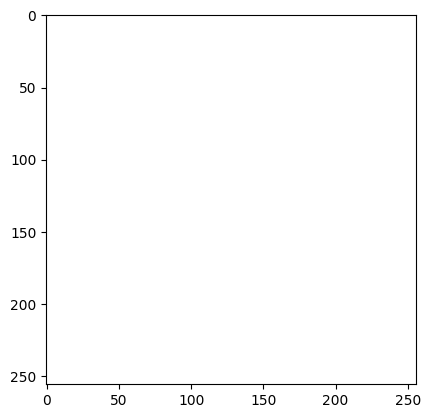

In [ ]:
import trimesh
import matplotlib.pyplot as plt

mano_trimesh = trimesh.load_mesh('data/mano_v1_2/MANO_UV_right.obj')
mano_uv = torch.tensor(mano_trimesh.visual.uv, dtype=torch.float32)
mano_map = torch.ones([256, 256, 3], dtype=torch.float32)


# print(uv)
print(mano_uv)
print(mano_map.shape)
plt.imshow(mano_map)
plt.show()

# オブジェクトの読み込み　(trimesh)

torch.float32
torch.Size([4096, 4096, 3])


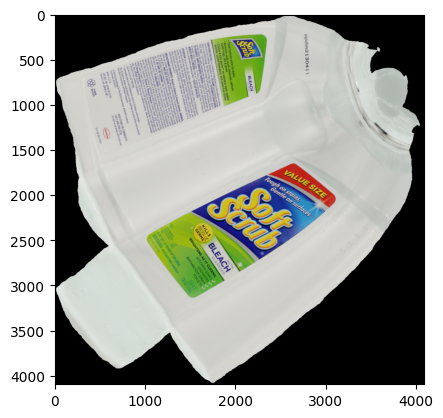

In [ ]:
import trimesh
import matplotlib.pyplot as plt
# from scipy.spatial.transform import Rotation


def get_obj_mesh(anno):
    obj_filename = f'data/models/{anno["objName"]}/textured_simple.obj'
    obj_trimesh = trimesh.load_mesh(obj_filename)

    obj_verts = torch.tensor(obj_trimesh.vertices, dtype=torch.float32)
    obj_faces = torch.tensor(obj_trimesh.faces, dtype=torch.int64)
    obj_uv = torch.tensor(obj_trimesh.visual.uv, dtype=torch.float32)
    obj_map = torch.from_numpy(np.array(obj_trimesh.visual.material.image, dtype=np.float32)) / 255.0

    return obj_verts, obj_faces, obj_uv, obj_map

obj_verts, obj_faces, obj_uv, obj_map = get_obj_mesh(anno)

print(obj_uv.dtype)
print(obj_map.shape)

plt.imshow(obj_map)
plt.show()

# show mesh
# scene = obj_trimesh.scene()
# scene.show() 

# オブジェクトの読み込み(pytorch3d)

In [ ]:
# import pytorch3d
# from pytorch3d.structures import Meshes
# # from pytorch3d.io import load_objs_as_meshes

# verts = torch.tensor(obj_trimesh.vertices, dtype=torch.float32)
# faces = torch.tensor(obj_trimesh.faces)
# print(verts.shape, faces.shape)

# device ='cuda:0'
# mesh = Meshes(
#     verts=[verts.to(device)],   
#     faces=[faces.to(device)],
#     # textures=textures
# )

torch.Size([8251, 3]) torch.Size([15728, 3])


# visualize mesh with plotly

In [ ]:
from pytorch3d.io import load_objs_as_meshes, load_obj
from pytorch3d.structures import Meshes
from pytorch3d.vis.plotly_vis import AxisArgs, plot_scene
from scipy.spatial.transform import Rotation

device = 'cuda:0'

# apply transform to obj_mesh
def apply_transform_to_mesh(verts, anno):
    objRmat = torch.tensor(Rotation.from_rotvec(anno['objRot'][:, 0]).as_matrix(), dtype=torch.float32)
    objTrans = torch.tensor(anno['objTrans']).unsqueeze(0)
    verts = (objRmat @ verts.T + objTrans.T).T
    return verts

obj_verts = torch.tensor(obj_trimesh.vertices, dtype=torch.float32)
obj_faces = torch.tensor(obj_trimesh.faces)
obj_verts = apply_transform_to_mesh(obj_verts, anno)

def create_mesh(verts, faces, device):
    print(verts.shape, faces.shape)
    mesh = Meshes(
        verts=[verts.to(device)],   
        faces=[faces.to(device)],
        # textures=textures.to(device)
    )
    return mesh

mano_mesh = create_mesh(
    mano_output.vertices[0], 
    torch.from_numpy(mano_layer['right'].faces.astype(np.int64)), 
    device)

obj_mesh = create_mesh(obj_verts, obj_faces, device)

plot_scene({
    "subplot": {
        "mano_hand": mano_mesh,
        "obj": obj_mesh
    }
})

ModuleNotFoundError: No module named 'pytorch3d'

# Render Mesh with pytorch3d

/tmp/ipykernel_177679/3317467558.py:17: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/tmp/ipykernel_177679/3366703098.py:95: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



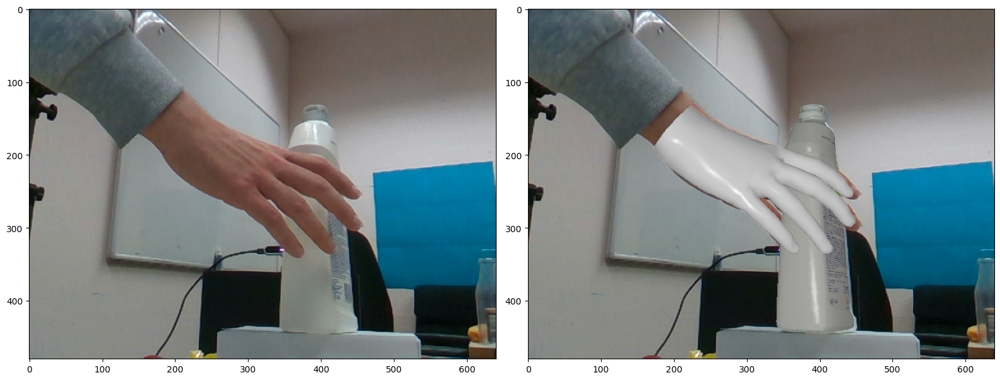

In [ ]:
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras, 
    PerspectiveCameras,
    PointLights, 
    DirectionalLights, 
    AmbientLights,
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    SoftPhongShader,
    HardPhongShader,
    TexturesUV,
    TexturesVertex
)
from pytorch3d.structures import join_meshes_as_scene
from matplotlib import pyplot as plt
from PIL import Image

device = 'cuda:0'


def create_camera(K, image_size):
    focal_lengths = K.diagonal()[:2]
    principal_point = K[:2, 2]
    R = torch.diag(torch.tensor([-1, 1, -1])).unsqueeze(0)
    T = torch.zeros(3).unsqueeze(0)
    cameras = PerspectiveCameras(
        device=device, 
        focal_length=[focal_lengths], 
        principal_point=[principal_point], 
        in_ndc=False,
        image_size = [image_size],
        R=R, T=T)
    return cameras


def create_renderer(anno, image_size, device='cuda:0'):

    cameras = create_camera(anno['camMat'], image_size)

    # lights = AmbientLights(device=device, ambient_color=((1.0, 0.0, 0.0)))
    # lights = DirectionalLights(device=device)
    lights = PointLights(device=device, location=[[0.0, 0.0, 0.0]])

    raster_settings = RasterizationSettings(
        image_size=image_size, 
        blur_radius=0.0, 
        faces_per_pixel=1, 
    )

    # create renderer
    renderer = MeshRenderer(
        rasterizer=MeshRasterizer(
            cameras=cameras, 
            raster_settings=raster_settings
        ),
        # shader=SoftPhongShader(
        shader=HardPhongShader(
            device=device, 
            cameras=cameras,
            lights=lights
        )
    )
    return renderer

def get_mesh_pt3d(verts, faces, uv, map):
    textures = TexturesUV(
            maps=map.to(device).unsqueeze(0),
            faces_uvs=faces.to(device).unsqueeze(0),
            verts_uvs=uv.to(device).unsqueeze(0),

        )
    return Meshes(
            verts=verts.to(device).unsqueeze(0),   
            faces=faces.to(device).unsqueeze(0),
            textures=textures.to(device)
        )


def render_scene(name="ABF10", frame="0000"):
    
    anno = load_ho_meta(f"data/HO3D_v3/train/{name}/meta/{frame}.pkl")
    img = np.array(Image.open(f"data/HO3D_v3/train/ABF10/rgb/{frame}.jpg"))

    # print(anno['camMat'])
    if anno['camMat'] is None:
        images = None
        print(anno)
    else:
        renderer = create_renderer(anno, img.shape[:2], device)

        obj_verts, obj_faces, obj_uv, obj_map = get_obj_mesh(anno)
        obj_verts = apply_transform_to_mesh(torch.tensor(obj_verts, dtype=torch.float32), anno)

        mano_output = get_mano_output(mano_layer, anno)

        mano_mesh = get_mesh_pt3d(mano_output.vertices[0], mano_faces, mano_uv, mano_map)
        obj_mesh = get_mesh_pt3d(obj_verts, obj_faces, obj_uv, obj_map)

        images = renderer(
                    join_meshes_as_scene([
                        mano_mesh, 
                        obj_mesh
                    ]), lights=lights, cameras=cameras)


    fig, axs = plt.subplots(1, 2, figsize=(16, 6))

    axs[0].imshow(img)
    axs[1].imshow(img)
    if images is not None:
        axs[1].imshow(images.cpu()[0])
    # plt.show()
    fig.tight_layout()
    plt.savefig(f"output/{name}_{frame}.png")
    # except Exception as e:
    #     print(e)
    #     print(anno['camMat'])
    #     img = np.array(Image.open(f"data/HO3D_v3/train/ABF10/rgb/{frame}.jpg"))
    #     fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    #     axs[0].imshow(img)
    #     axs[1].imshow(img)
    #     # axs[1].imshow(images.cpu()[0])
    #     plt.show()



render_scene()

  0%|          | 0/14 [00:00<?, ?it/s]/tmp/ipykernel_177679/3317467558.py:17: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/tmp/ipykernel_177679/3366703098.py:95: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

 50%|█████     | 7/14 [00:07<00:07,  1.08s/it]

{'handBeta': None, 'handTrans': None, 'handPose': None, 'handJoints3D': None, 'camMat': None, 'objRot': None, 'objTrans': None, 'camIDList': array(['1', '0', '4', '3', '2'], dtype='<U1'), 'objCorners3D': None, 'objCorners3DRest': None, 'objName': array('021_bleach_cleanser', dtype='<U19'), 'objLabel': array(12)}


 57%|█████▋    | 8/14 [00:08<00:05,  1.16it/s]

{'handBeta': None, 'handTrans': None, 'handPose': None, 'handJoints3D': None, 'camMat': None, 'objRot': None, 'objTrans': None, 'camIDList': array(['1', '0', '4', '3', '2'], dtype='<U1'), 'objCorners3D': None, 'objCorners3DRest': None, 'objName': array('021_bleach_cleanser', dtype='<U19'), 'objLabel': array(12)}


 86%|████████▌ | 12/14 [00:11<00:01,  1.04it/s]

{'handBeta': None, 'handTrans': None, 'handPose': None, 'handJoints3D': None, 'camMat': None, 'objRot': None, 'objTrans': None, 'camIDList': array(['1', '0', '4', '3', '2'], dtype='<U1'), 'objCorners3D': None, 'objCorners3DRest': None, 'objName': array('021_bleach_cleanser', dtype='<U19'), 'objLabel': array(12)}


100%|██████████| 14/14 [00:13<00:00,  1.06it/s]


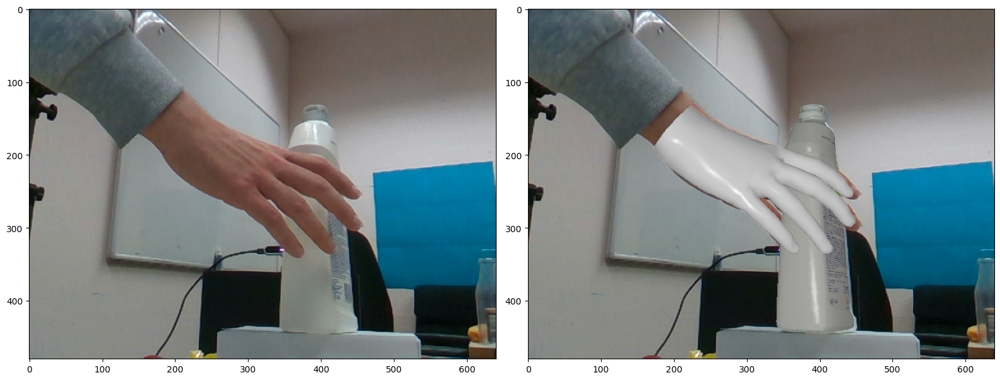

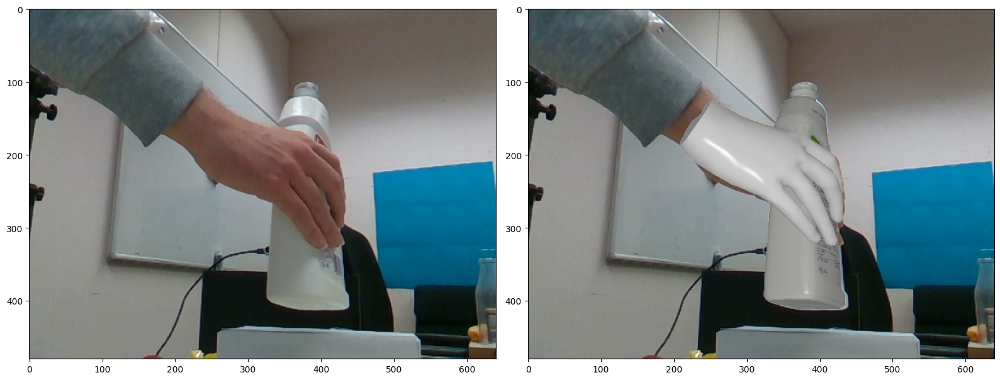

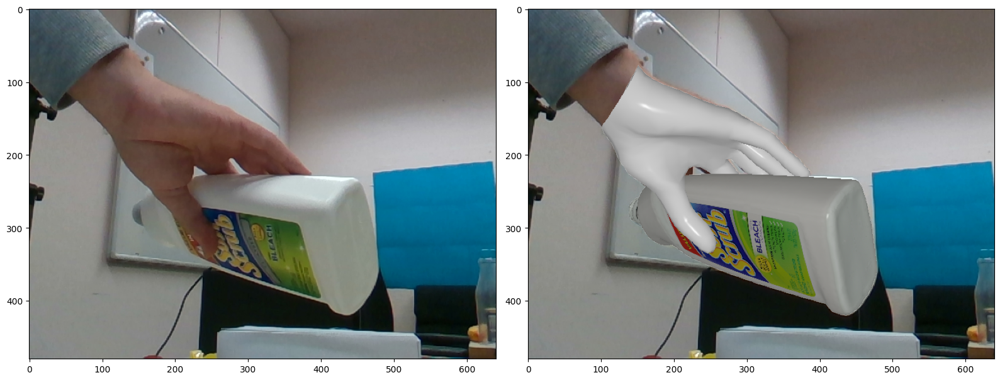

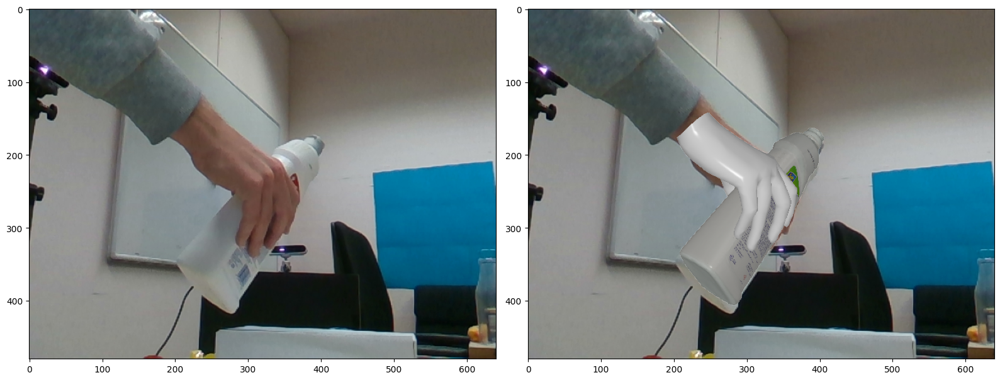

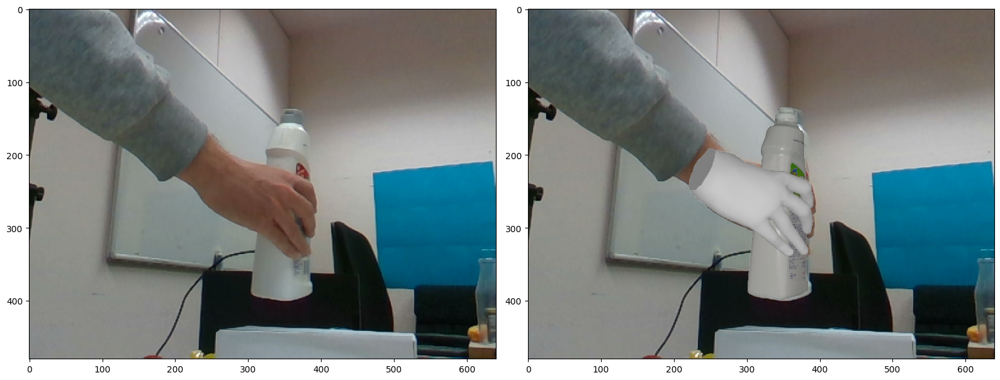

...

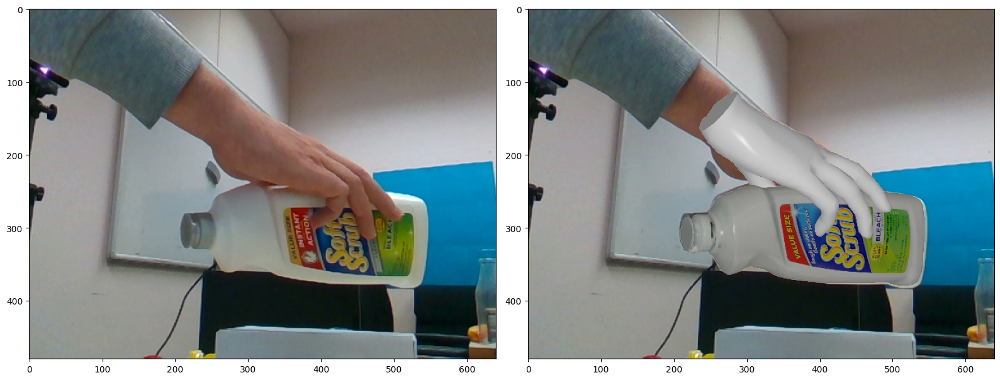

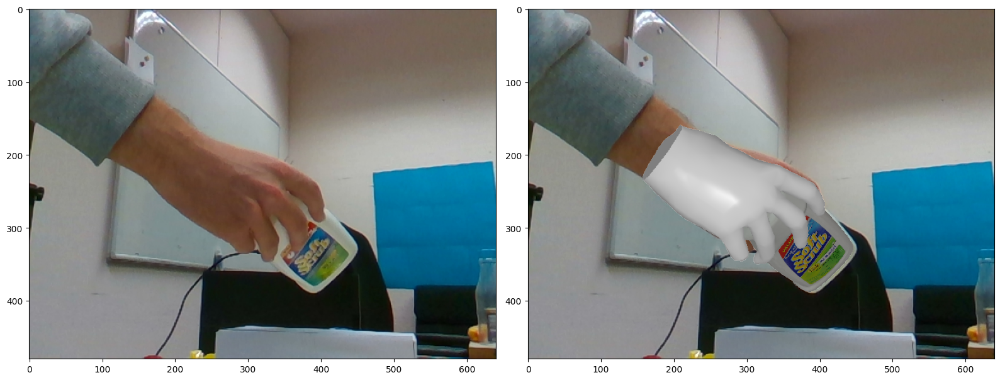

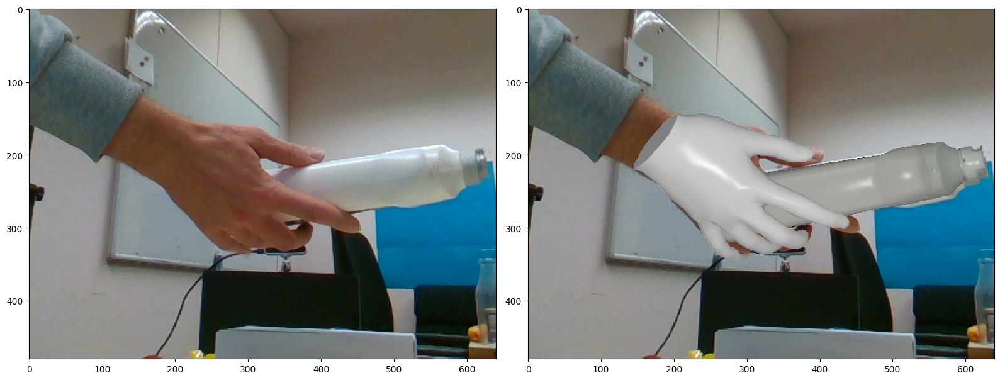

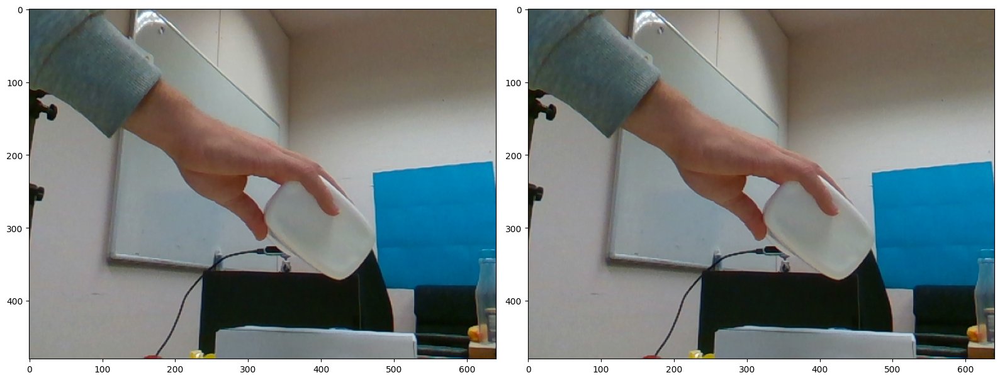

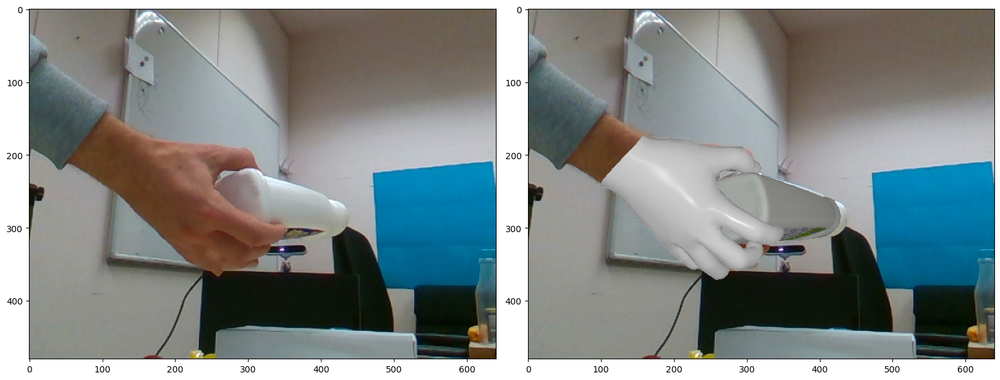

In [ ]:
from tqdm import tqdm

name = 'ABF10'
for i in tqdm(range(0, 1382, 100)):
    # print(name, f"{i:04d}")
    render_scene(name, f"{i:04d}")